# Dependencies and libaries

## Install dependencies: (use cu101 because colab has CUDA 10.1)

In [2]:
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 34.8 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0+cu113
    Uninstalling torch-1.11.0+cu113:
      Successfully uninstalled torch-1.11.0+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0+cu113
    Uninstalling torchvision-0.12.0+cu113:
      Successfully uninstalled torchvision-0.12.0+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.12.0 requires torch==1.11.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.11.0+cu113 requires torch==1.11.0, but you have torch 1.5.0+cu101

## Install detectron2

In [3]:
# install detectron2:
!pip install detectron2==0.1.3 -f\
                 https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 662 kB/s 
     |████████████████████████████████| 50 kB 6.0 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=7fee04e4211f34091a55652516d775427cf1c355793fe924e2a404b0ae62d7e8
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
Successfully built fvcore


## Import libraries

In [4]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import numpy as np
import random
import glob
import cv2
import random
import os
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import ColorMode

from detectron2.utils.visualizer import Visualizer
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, DatasetEvaluator
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.config import get_cfg




# Some preparations

## Registering dataset
register_coco_instances(`name`, {}, `path to labels`, `path to dataset`)

In [ ]:
register_coco_instances("dataset_train", {}, \
        "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/train_/_annotations.coco.json", \
        "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/train_")
register_coco_instances("dataset_val", {}, \
        "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/valid/_annotations.coco.json", \
        "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/valid")
register_coco_instances("dataset_test", {}, \
        "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/test/_annotations.coco.json", \
        "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/test")

## Plotting some training imgaes

In [ ]:
# my_dataset_train_metadata = MetadataCatalog.get("dataset_train")
# dataset_dicts = DatasetCatalog.get("dataset_train")

# for d in random.sample(dataset_dicts, 3):
#     img = cv2.imread(d["file_name"])
#     visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.25)
#     vis = visualizer.draw_dataset_dict(d)
#     cv2_imshow(vis.get_image()[:, :, ::-1])

## Trainer class

In [ ]:
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

# Training
There is a parameter called resume (you can see at the end of the code cell below)
* resume=False if you training for the first time,
* resume=True if you want to resume training

In [ ]:

cfg = get_cfg()

# Get the pretrained configuration file
# https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))

# Get the training dataset
cfg.DATASETS.TRAIN = ("dataset_train",)

# Get the testing dataset
cfg.DATASETS.TEST = ("dataset_val",)

# Number of data loading threads
cfg.DATALOADER.NUM_WORKERS = 4

# Get the pretrained weights
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo

# Number of images to be taken into a batch
cfg.SOLVER.IMS_PER_BATCH = 4

# Initial learning rate
cfg.SOLVER.BASE_LR = 0.001 

# Set the number of iterations for warmup in the initial training stage
cfg.SOLVER.WARMUP_ITERS = 1000

# Set the iterations (epochs)
cfg.SOLVER.MAX_ITER = 20000 # Adjust up if val mAP is still rising, adjust down if overfit

# The iteration number to decrease learning rate by GAMMA
cfg.SOLVER.STEPS = (6000, 10000)
cfg.SOLVER.GAMMA = 0.05

# Use GPU to train
cfg.MODEL.DEVICE = 'cuda'

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64

# Number of classes + 1
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 

# Set the period test model
cfg.TEST.EVAL_PERIOD = 500

# Set the output directory
cfg.OUTPUT_DIR = "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/notaug_Output"

# Save a checkpoint after every this number of iterations
cfg.SOLVER.CHECKPOINT_PERIOD = 500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg)

# resume=False if you training for the first time,
# resume=True if you want to resume training
trainer.resume_or_load(resume=True)
trainer.train()

# Calculate mAP

## Augmented dataset

###  mAP on validation dataset

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "dataset_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [06/23 12:21:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/23 12:21:21 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/valid/_annotations.coco.json
[06/23 12:21:22 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   ChayLa   | 0            |   ChayLa   | 51           |  DomTrang  | 79           |
|            |              |            |              |            |              |
|   total    | 130          |            |              |            |              |
[06/23 12:21:22 d2.data.common]: Serializing 50 elements to byte tensors and concatenating them all ...
[06/23 12:21:22 d2.data.common]: Serialized dataset takes 0.02 MiB
[06/

OrderedDict([('bbox',
              {'AP': 66.15653977292861,
               'AP-ChayLa': 89.13985488701591,
               'AP-DomTrang': 82.02501040501701,
               'AP50': 85.58243264601647,
               'AP75': 77.37621213402507,
               'APl': 66.15653977292861,
               'APm': nan,
               'APs': nan})])

### mAP on test dataset

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/08 14:44:03 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/08 14:44:03 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/test/_annotations.coco.json
[07/08 14:44:03 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   ChayLa   | 0            |   ChayLa   | 94           |  DomTrang  | 168          |
|            |              |            |              |            |              |
|   total    | 262          |            |              |            |              |
[07/08 14:44:03 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[07/08 14:44:03 d2.data.common]: Serialized dataset takes 0.04 MiB
[07

OrderedDict([('bbox',
              {'AP': 56.950155717739214,
               'AP-ChayLa': 68.22015295491425,
               'AP-DomTrang': 73.75712947106629,
               'AP50': 70.98864121299027,
               'AP75': 67.2894021683491,
               'APl': 56.950155717739214,
               'APm': nan,
               'APs': nan})])

## Not augmented datset

###mAP on validation dataset

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "dataset_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/08 14:52:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/08 14:52:24 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/valid/_annotations.coco.json
[07/08 14:52:24 d2.data.common]: Serializing 50 elements to byte tensors and concatenating them all ...
[07/08 14:52:24 d2.data.common]: Serialized dataset takes 0.02 MiB
[07/08 14:52:24 d2.evaluation.evaluator]: Start inference on 50 images
[07/08 14:52:30 d2.evaluation.evaluator]: Inference done 11/50. 0.2805 s / img. ETA=0:00:17
[07/08 14:52:35 d2.evaluation.evaluator]: Inference done 24/50. 0.2830 s / img. ETA=0:00:10
[07/08 14:52:41 d2.evaluation.evaluator]: Inference done 34/50. 0.2815 s / img. ETA=0:00:07
[07/08 14:52:46 d2.evaluation.evaluator]: Inference done 45/50. 0.2806 s / img. ETA=0:00:02
[07/08 14:52:47 d2.evaluation.evaluator]: Total inference time: 0:00:19.68672

OrderedDict([('bbox',
              {'AP': 62.65918749900461,
               'AP-ChayLa': 74.82977185520487,
               'AP-DomTrang': 84.60565857715677,
               'AP50': 79.7177152161808,
               'AP75': 72.58871014152585,
               'APl': 62.65918749900461,
               'APm': nan,
               'APs': nan})])

## mAP on test dataset

In [ ]:

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/08 14:47:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/08 14:47:57 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/test/_annotations.coco.json
[07/08 14:47:57 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[07/08 14:47:57 d2.data.common]: Serialized dataset takes 0.04 MiB
[07/08 14:47:57 d2.evaluation.evaluator]: Start inference on 100 images
[07/08 14:48:05 d2.evaluation.evaluator]: Inference done 11/100. 0.2628 s / img. ETA=0:00:39
[07/08 14:48:12 d2.evaluation.evaluator]: Inference done 21/100. 0.2671 s / img. ETA=0:00:43
[07/08 14:48:17 d2.evaluation.evaluator]: Inference done 31/100. 0.2680 s / img. ETA=0:00:36
[07/08 14:48:23 d2.evaluation.evaluator]: Inference done 41/100. 0.2677 s / img. ETA=0:00:33
[07/08 14:48:28 d2.evaluation.evaluator]: Inference done 52/100. 0.2692

OrderedDict([('bbox',
              {'AP': 55.20846866334151,
               'AP-ChayLa': 67.55695064428154,
               'AP-DomTrang': 71.30928238852249,
               'AP50': 69.43311651640201,
               'AP75': 64.41864116020135,
               'APl': 55.20846866334151,
               'APm': nan,
               'APs': nan})])

# Testing on image

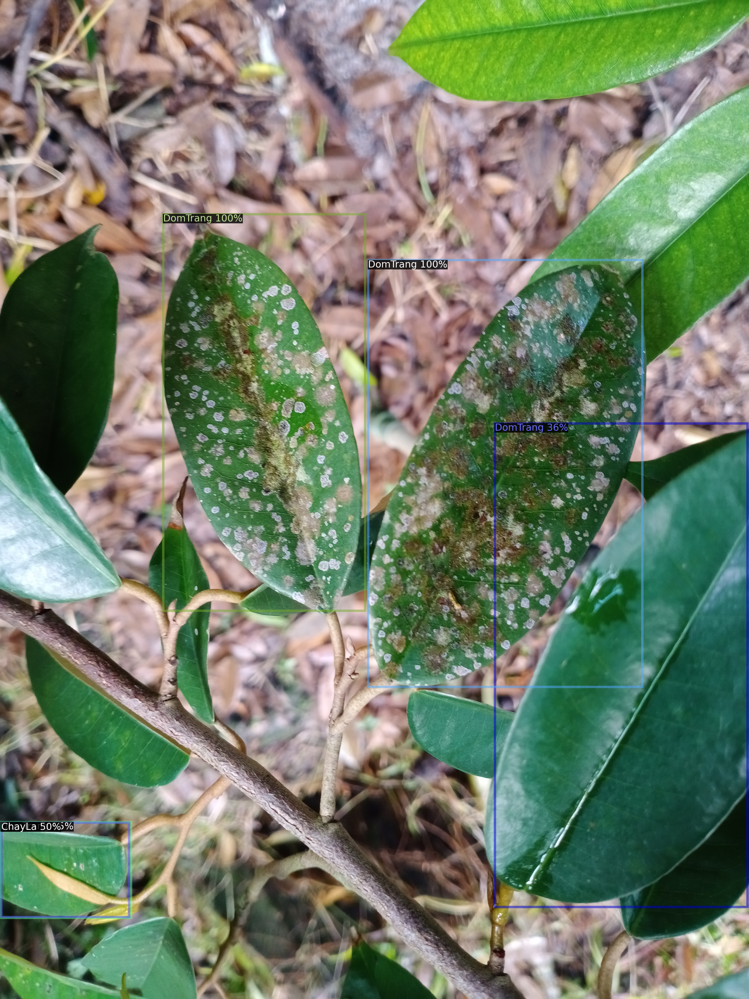

In [ ]:

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# Get the training dataset
cfg.DATASETS.TRAIN = ("dataset_train",)

# Use GPU to train
cfg.MODEL.DEVICE = 'cuda'

# Number of classes + 1
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 

# Output dir to load model
cfg.OUTPUT_DIR = "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/Output_"

# Load weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# Set thresh
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25   # set the testing threshold for this model



predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])


# Read image and detect
im = cv2.imread('/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Data/Test/DomTrang/image (46).jpg')
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
            metadata=test_metadata, 
            scale=0.8
                )

# Draw bounding box and plot image
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
outputs

{'instances': Instances(num_instances=5, image_height=4608, image_width=3456, fields=[pred_boxes: Boxes(tensor([[7.5275e+02, 9.8838e+02, 1.6840e+03, 2.8170e+03],
         [1.6977e+03, 1.2006e+03, 2.9620e+03, 3.1684e+03],
         [1.6111e+00, 3.7919e+03, 6.0359e+02, 4.2327e+03],
         [5.7748e+00, 3.7938e+03, 5.9451e+02, 4.2296e+03],
         [2.2821e+03, 1.9531e+03, 3.4477e+03, 4.1832e+03]], device='cuda:0')), scores: tensor([0.9993, 0.9990, 0.5492, 0.4970, 0.3573], device='cuda:0'), pred_classes: tensor([2, 2, 2, 1, 2], device='cuda:0')])}

# Cartucho's repo

In [ ]:
instance = outputs['instances']
instance

Instances(num_instances=5, image_height=4608, image_width=3456, fields=[pred_boxes: Boxes(tensor([[7.5275e+02, 9.8838e+02, 1.6840e+03, 2.8170e+03],
        [1.6977e+03, 1.2006e+03, 2.9620e+03, 3.1684e+03],
        [1.6111e+00, 3.7919e+03, 6.0359e+02, 4.2327e+03],
        [5.7748e+00, 3.7938e+03, 5.9451e+02, 4.2296e+03],
        [2.2821e+03, 1.9531e+03, 3.4477e+03, 4.1832e+03]], device='cuda:0')), scores: tensor([0.9993, 0.9990, 0.5492, 0.4970, 0.3573], device='cuda:0'), pred_classes: tensor([2, 2, 2, 1, 2], device='cuda:0')])

In [ ]:
len(instance)

5

In [ ]:
instance.get_fields

<bound method Instances.get_fields of Instances(num_instances=5, image_height=4608, image_width=3456, fields=[pred_boxes: Boxes(tensor([[7.5275e+02, 9.8838e+02, 1.6840e+03, 2.8170e+03],
        [1.6977e+03, 1.2006e+03, 2.9620e+03, 3.1684e+03],
        [1.6111e+00, 3.7919e+03, 6.0359e+02, 4.2327e+03],
        [5.7748e+00, 3.7938e+03, 5.9451e+02, 4.2296e+03],
        [2.2821e+03, 1.9531e+03, 3.4477e+03, 4.1832e+03]], device='cuda:0')), scores: tensor([0.9993, 0.9990, 0.5492, 0.4970, 0.3573], device='cuda:0'), pred_classes: tensor([2, 2, 2, 1, 2], device='cuda:0')])>

In [ ]:
instance.get('scores')

tensor([0.9993, 0.9990, 0.5492, 0.4970, 0.3573], device='cuda:0')

In [ ]:
instance.get('pred_boxes')

Boxes(tensor([[7.5275e+02, 9.8838e+02, 1.6840e+03, 2.8170e+03],
        [1.6977e+03, 1.2006e+03, 2.9620e+03, 3.1684e+03],
        [1.6111e+00, 3.7919e+03, 6.0359e+02, 4.2327e+03],
        [5.7748e+00, 3.7938e+03, 5.9451e+02, 4.2296e+03],
        [2.2821e+03, 1.9531e+03, 3.4477e+03, 4.1832e+03]], device='cuda:0'))

In [ ]:
instance.get('pred_classes')

tensor([2, 2, 2, 1, 2], device='cuda:0')

In [ ]:
boxes = instance.get('pred_boxes')
boxes = boxes.tensor
boxes

tensor([[7.5275e+02, 9.8838e+02, 1.6840e+03, 2.8170e+03],
        [1.6977e+03, 1.2006e+03, 2.9620e+03, 3.1684e+03],
        [1.6111e+00, 3.7919e+03, 6.0359e+02, 4.2327e+03],
        [5.7748e+00, 3.7938e+03, 5.9451e+02, 4.2296e+03],
        [2.2821e+03, 1.9531e+03, 3.4477e+03, 4.1832e+03]], device='cuda:0')

In [ ]:
x, y, w, h = boxes[0][0].item(), boxes[0][1].item(), boxes[0][2].item(), boxes[0][3].item(), 

In [ ]:
print(x, y, w, h)

752.7467041015625 988.3801879882812 1683.9918212890625 2816.9580078125


In [ ]:
type(boxes[0][0].item())

float

In [ ]:
scores = instance.get('scores')
instance.get('pred_classes')
boxes = instance.get('pred_boxes')
boxes = boxes.tensor
for i in range(len(instance)):


In [5]:
import glob2
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# Get the training dataset
cfg.DATASETS.TRAIN = ("dataset_train",)

# Use GPU to train
cfg.MODEL.DEVICE = 'cuda'

# Number of classes + 1
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 

# Output dir to load model
cfg.OUTPUT_DIR = "/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/notaug_Output"

# Load weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# Set thresh
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25   # set the testing threshold for this model



predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])

PATH_IMG = '/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Model/Faster R-CNN/MyData/test'
PATH_SAVE = '/content/drive/MyDrive/CS114.M21.KHCL/DoAn/Cartucho/mAP_FasterRCNN/input/detection-results'
files = glob2.glob(os.path.join(PATH_IMG, "*jpg"))
for i in files:
    im = cv2.imread(i)
    name = i[74:-4]
    H, W, C = im.shape
    outputs = predictor(im)
    instance = outputs['instances']
    scores = instance.get('scores')
    instance.get('pred_classes')
    classes = instance.get('pred_classes')
    boxes = instance.get('pred_boxes')
    boxes = boxes.tensor
    with open(os.path.join(PATH_SAVE, name + '.txt'), 'w') as f:
        for i in range(len(instance)):
            classID = classes[i].item()
            className = 'ChayLa' if classID == 1 else 'DomTrang'
            score = scores[i].item()
            x, y, w, h = int(boxes[i][0].item()), int(boxes[i][1].item()), int(boxes[i][2].item()), int(boxes[i][3].item())
            
            f.write(f'{className} {score} {x} {y} {w} {h}\n')
    f.close()
